

**Тема: Сегментация объектов с использованием Mask R-CNN**

**Цель работы:** Познакомиться с архитектурой Mask R-CNN и научиться выполнять сегментацию объектов на изображениях.

**Задачи:**

- Изучить теоретические основы instance segmentation.
- Ознакомиться с архитектурой Mask R-CNN.
- Провести инференс предобученной модели на выбранных изображениях.
- Визуализировать результаты: bounding boxes, маски объектов.
- Рассчитать метрики оценки качества масок.
- Проанализировать ошибки сегментации.
- Провести исследование зависимости качества от параметров confidence score и mask threshold.

### 1. Теоретическая часть

В данной лабораторной работе мы познакомимся с задачей детекции на примере архитектуры [Mask R-CNN](https://arxiv.org/pdf/1703.06870), обученной на наборе данных [COCO](https://cocodataset.org/#home), а также с новой задачей компьютерного зрения - сегментацией. 

**Перед тем, как приступать к выполнению практической части, ознакомьтесь с первоисточниками используемых компонентов, а также документацией по [ссылке](https://pytorch.org/vision/main/models/mask_rcnn.html), включающей подробности работы с моделью и новым форматом данных, сэмплы кода.**

#### 1.1 Instance Segmentation и архитектура Mask R-CNN

Instance segmentation — это задача, в которой необходимо не только обнаружить объект и его класс, но и сегментировать его границы на уровне пикселей. Это усложнённая версия задачи детекции, так как bounding box не всегда точно соответствует форме объекта.

В отличие от semantic segmentation, где модель выдает одну маску на класс, в instance segmentation выделяется каждый объект независимо, даже если они относятся к одному классу.

Mask R-CNN — это расширение Faster R-CNN, дополненное ещё одним выходом: бинарной маской для каждого обнаруженного объекта.

Архитектура Mask R-CNN включает:

1. Backbone (например, ResNet-50) — извлекает карты признаков из изображения.
2. Region Proposal Network (RPN) — предлагает кандидаты на объекты.
3. ROI Align / ROI Pooling — извлекает фиксированные области из фичей.
4. Bounding Box Head — классифицирует объект и уточняет координаты.
5. Mask Head — предсказывает маску для каждого класса, соответствующую bounding box.


#### 1.2 Формат данных для задачи детекции

При запуске инференса модель возвращает словарь с результатами: координаты bounding boxes, классы объектов, confidence score и маски объектов (представлены как float значения от 0 до 1).

В рамках выполнения работы в зависимости от варианта вам предстоит познакомиться с другими форматами файлов и их содержимым.

### Варианты 

Выполните задание в соответствии со своим вариантом по списку с использованием предобученной модели. 

**Вариант 1  - Pascal VOC 2007. Сравнить предсказания модели с реальной разметкой и провести количественную оценку:**

- Выполнить инференс модели на 20 изображениях;
- Визуализировать bounding boxes и маски;
- Проанализировать качество предсказаний;
- Описать, какие классы модель распознала, какие пропустила.

**Вариант 2 — COCO 2017. Сравнить предсказания модели с реальной разметкой и провести количественную оценку:**

- Выполнить инференс на 20 изображениях;
- Визуализировать предсказания;
- Сравнить полученные маски с ground truth;
- Рассчитать IoU, Pixel Accuracy или Precision/Recall; 

**Вариант 3 — Cityscapes. Проверить, как модель работает на новых изображениях, визуализировать предсказания и сравнить с известными аннотациями:**

- Выполнить инференс на 20 изображениях;
- Визуализировать предсказания; 
- Сравнить полученные маски с ground truth;
- Рассчитать IoU, Pixel Accuracy или Precision/Recall;


### 2. Практическая часть

#### 2.1 Подготовка окружения

Установите зависимости и библиотеки:

In [1]:

import os
import random
import numpy as np
import torch
import torchvision
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw
from torchvision.models.detection import maskrcnn_resnet50_fpn, MaskRCNN_ResNet50_FPN_Weights

print("numpy:", np.__version__)
print("torch:", torch.__version__)
print("torchvision:", torchvision.__version__)

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

numpy: 1.26.4
torch: 2.8.0+cpu
torchvision: 0.23.0+cpu
Using device: cpu


#### 2.2 Подготовка модели

Загрузите предобученную модель, определите устройство, переведите модель в режим инференса:

In [2]:
weights = MaskRCNN_ResNet50_FPN_Weights.DEFAULT
model = maskrcnn_resnet50_fpn(weights=weights)
model.to(device)
model.eval()

COCO_CLASSES = weights.meta["categories"]

print("Количество классов:", len(COCO_CLASSES))
print("Пример классов:", COCO_CLASSES[:10])

Количество классов: 91
Пример классов: ['__background__', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat']


#### 2.3 Загрузка и предобработка изображений


Затем импортируйте датасет из соответствующих пакетов PyTorch и определите метод трансформации данных для подачи в модель:

In [3]:
# 2.3 Загрузка и предобработка изображений (COCO 2017 val)

from torchvision.datasets import CocoDetection

COCO_ROOT = r"datasets/coco2017"  # <-- как у тебя в Jupyter

IMG_DIR  = os.path.join(COCO_ROOT, "val2017")
ANN_FILE = os.path.join(COCO_ROOT, "annotations", "instances_val2017.json")

assert os.path.isdir(IMG_DIR), f"Не найдена папка с изображениями: {IMG_DIR}"
assert os.path.isfile(ANN_FILE), f"Не найден файл аннотаций: {ANN_FILE}"

print("IMG_DIR:", IMG_DIR)
print("ANN_FILE:", ANN_FILE)

# Трансформации под веса модели (правильная предобработка)
transform = weights.transforms()

# Датасет COCO
dataset = CocoDetection(root=IMG_DIR, annFile=ANN_FILE)

print("COCO val size:", len(dataset))

IMG_DIR: datasets/coco2017\val2017
ANN_FILE: datasets/coco2017\annotations\instances_val2017.json
loading annotations into memory...
Done (t=0.79s)
creating index...
index created!
COCO val size: 5000


#### 2.4 Предсказания и извлечение масок

Если вы работаете с Pascal VOC, вам потребуется прочитать файлы, содержащие разметку. Если вы работаете с COCO или Cityscapes, аннотации читаются через готовые методы COCO API:

In [4]:
import os, random
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

from torchvision.datasets import CocoDetection
from pycocotools import mask as coco_mask

COCO_ROOT = r"C:\Users\podzo\datasets\coco2017"
IMG_DIR   = os.path.join(COCO_ROOT, "val2017")
ANN_FILE  = os.path.join(COCO_ROOT, "annotations", "instances_val2017.json")

assert os.path.isdir(IMG_DIR), f"Не найдена папка: {IMG_DIR}"
assert os.path.isfile(ANN_FILE), f"Не найден файл: {ANN_FILE}"

dataset = CocoDetection(root=IMG_DIR, annFile=ANN_FILE)
coco_api = dataset.coco

transform = weights.transforms()

def ann_to_mask(ann, h, w):
    seg = ann.get("segmentation", None)
    if seg is None:
        return None

    if isinstance(seg, list):
        rles = coco_mask.frPyObjects(seg, h, w)
        rle = coco_mask.merge(rles)
        m = coco_mask.decode(rle)

    elif isinstance(seg, dict):
        if isinstance(seg.get("counts", None), list):
            rle = coco_mask.frPyObjects(seg, h, w)
            m = coco_mask.decode(rle)
        else:
            m = coco_mask.decode(seg)
    else:
        return None

    if m.ndim == 3:
        m = m[:, :, 0]
    return (m > 0).astype(np.uint8)

@torch.no_grad()
def predict_one(model, pil_img):
    x = transform(pil_img).to(device)
    pred = model([x])[0]
    return {
        "boxes": pred["boxes"].detach().cpu().numpy(),
        "labels": pred["labels"].detach().cpu().numpy(),
        "scores": pred["scores"].detach().cpu().numpy(),
        "masks":  pred["masks"].detach().cpu().numpy(),
    }

def build_gt(dataset, idx):
    pil_img, anns = dataset[idx]
    w, h = pil_img.size
    gt_masks, gt_labels = [], []
    for ann in anns:
        m = ann_to_mask(ann, h, w)
        if m is None:
            continue
        gt_masks.append(m)
        gt_labels.append(int(ann["category_id"]))
    return pil_img, np.array(gt_labels, dtype=int), gt_masks

def mask_iou(pred_mask, gt_mask):
    pred = pred_mask.astype(bool)
    gt = gt_mask.astype(bool)
    inter = np.logical_and(pred, gt).sum()
    union = np.logical_or(pred, gt).sum()
    return float(inter / union) if union > 0 else 0.0

def fp_fn_pixels(pred_mask, gt_mask):
    pred = pred_mask.astype(bool)
    gt = gt_mask.astype(bool)
    fp = np.logical_and(pred, np.logical_not(gt)).sum()
    fn = np.logical_and(np.logical_not(pred), gt).sum()
    return int(fp), int(fn)

def match_by_iou_same_class(pred_masks, pred_labels, gt_masks, gt_labels, iou_thr=0.5):
    matches = []
    used_pred = set()

    for gi, (gmask, glab) in enumerate(zip(gt_masks, gt_labels)):
        best_pi, best_iou = -1, 0.0
        for pi, (pmask, plab) in enumerate(zip(pred_masks, pred_labels)):
            if pi in used_pred:
                continue
            if int(plab) != int(glab):
                continue
            iou = mask_iou(pmask, gmask)
            if iou > best_iou:
                best_pi, best_iou = pi, iou

        if best_pi != -1 and best_iou >= iou_thr:
            used_pred.add(best_pi)
            matches.append((gi, best_pi, best_iou))

    unmatched_gt = [i for i in range(len(gt_masks)) if i not in [m[0] for m in matches]]
    unmatched_pred = [i for i in range(len(pred_masks)) if i not in [m[1] for m in matches]]
    return matches, unmatched_gt, unmatched_pred

print("COCO size:", len(dataset))
print("IMG_DIR:", IMG_DIR)
print("ANN_FILE:", ANN_FILE)

loading annotations into memory...
Done (t=0.83s)
creating index...
index created!
COCO size: 5000
IMG_DIR: C:\Users\podzo\datasets\coco2017\val2017
ANN_FILE: C:\Users\podzo\datasets\coco2017\annotations\instances_val2017.json


#### 2.5 Оценка модели и визуализация результатов

Визуализируйте bounding box, название класса, маску поверх изображения. Для каждой маски и её соответствующего ground truth (если имеется), вычислите: IoU, количество FP пикселей, количество FN пикселей:

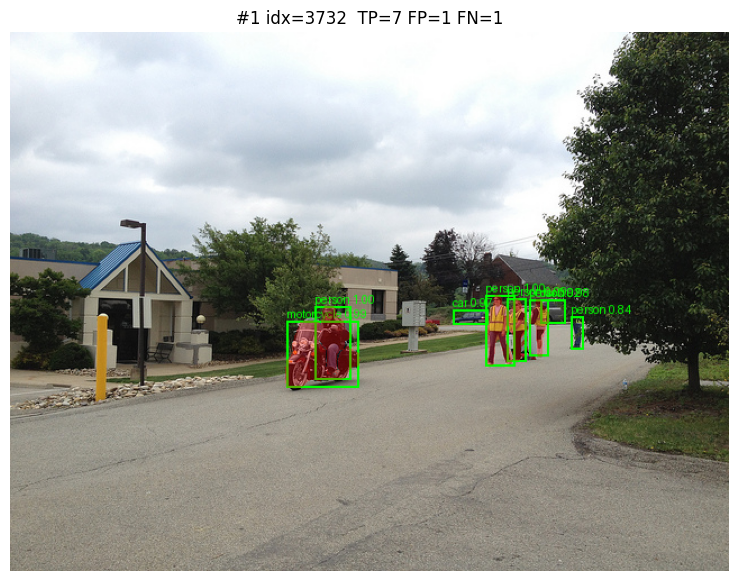

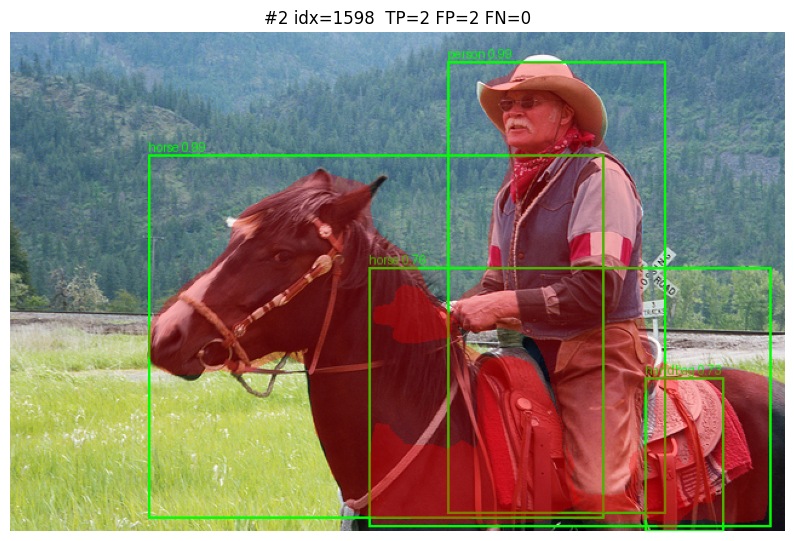

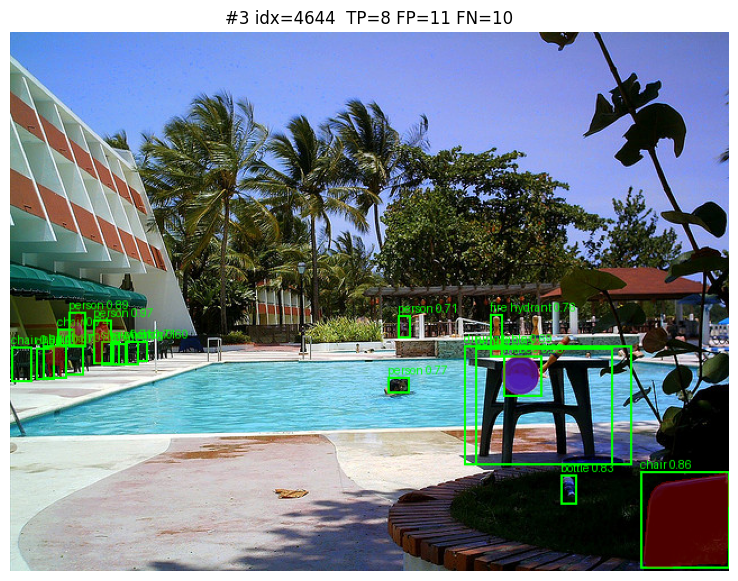

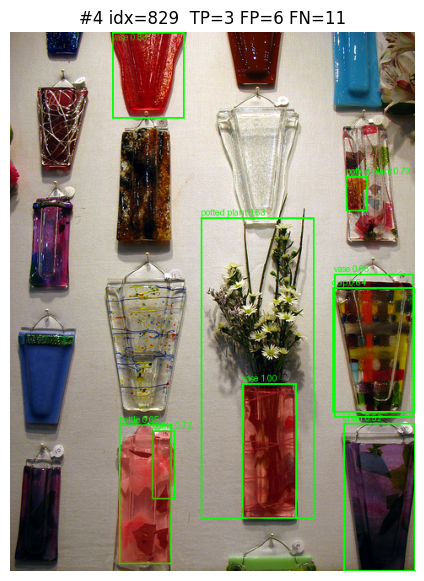

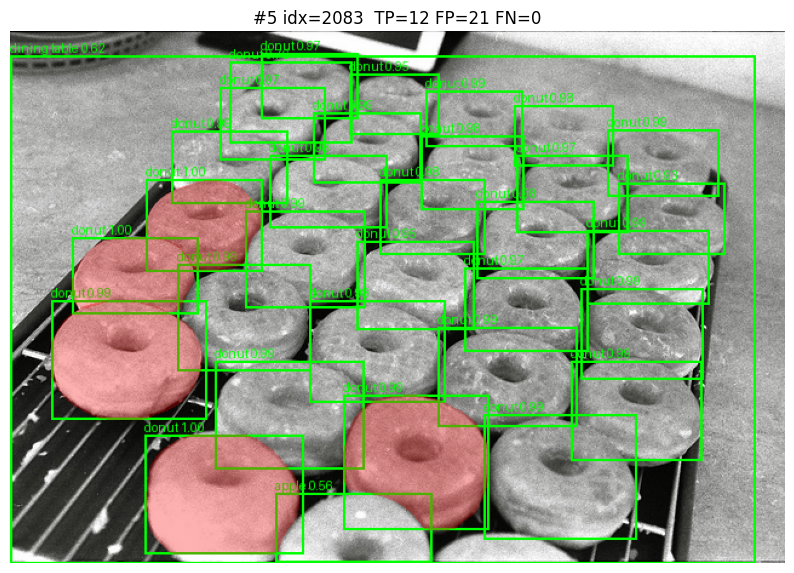

...

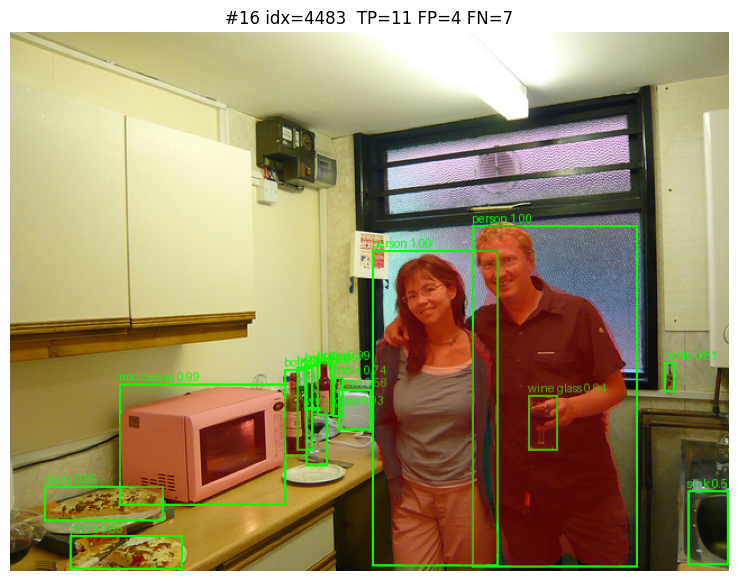

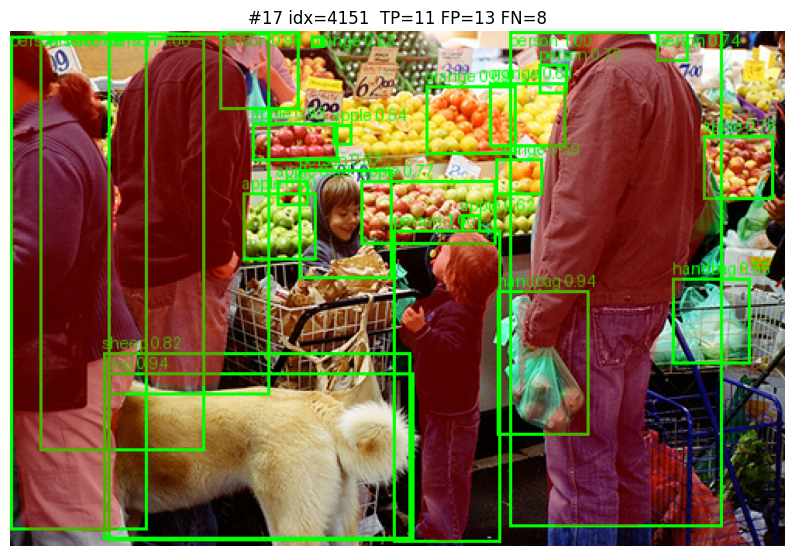

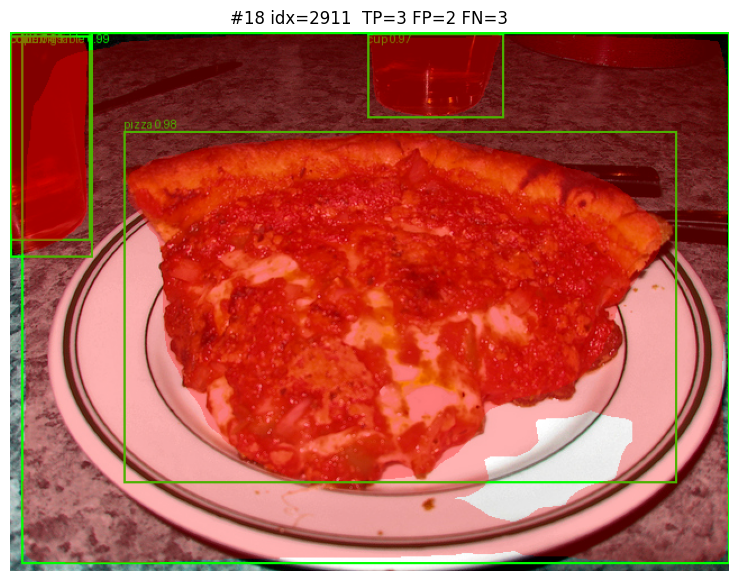

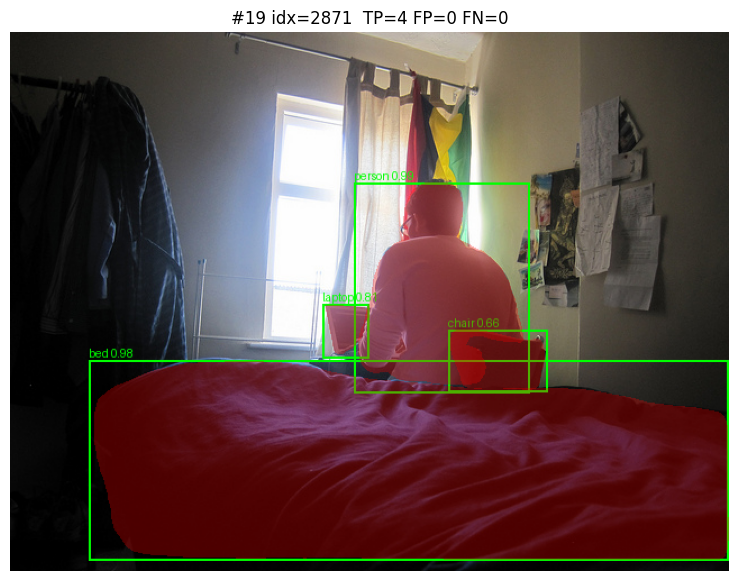

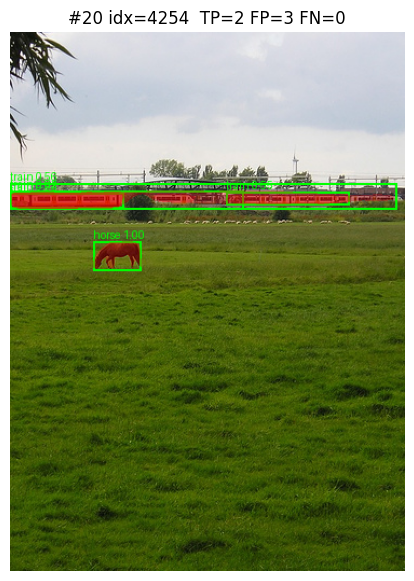


=== Итог по 20 изображениям ===
TP: 109 FP(inst): 96 FN(inst): 59
Instance Precision: 0.5317073170731708
Instance Recall: 0.6488095238095238
Mean IoU (matched): 0.8049931973754589
Total FP pixels: 73532
Total FN pixels: 74690


In [5]:
def overlay_mask(img_rgb, mask, alpha=0.35):
    img = np.array(img_rgb).astype(np.float32)
    m = mask.astype(bool)
    color = np.array([255, 0, 0], dtype=np.float32)
    img[m] = img[m] * (1 - alpha) + color * alpha
    return Image.fromarray(img.astype(np.uint8))

def draw_boxes(img, boxes, labels, scores, coco_api):
    out = img.copy()
    dr = ImageDraw.Draw(out)
    for b, lab, sc in zip(boxes, labels, scores):
        x1, y1, x2, y2 = [int(v) for v in b]
        name = coco_api.loadCats([int(lab)])[0]["name"]
        dr.rectangle([x1, y1, x2, y2], outline=(0, 255, 0), width=2)
        dr.text((x1, max(0, y1 - 12)), f"{name} {sc:.2f}", fill=(0, 255, 0))
    return out

N = 20
conf_thr = 0.5
mask_thr = 0.5
iou_match_thr = 0.5

indices = random.sample(range(len(dataset)), N)

all_ious = []
all_fp = 0
all_fn = 0
tp = 0
fp_inst = 0
fn_inst = 0

for k, idx in enumerate(indices, 1):
    pil_img, gt_labels, gt_masks = build_gt(dataset, idx)
    pred = predict_one(model, pil_img)

    keep = pred["scores"] >= conf_thr
    boxes = pred["boxes"][keep]
    labels = pred["labels"][keep]
    scores = pred["scores"][keep]
    masks_f = pred["masks"][keep]

    pred_masks = [(m[0] >= mask_thr).astype(np.uint8) for m in masks_f]

    matches, un_gt, un_pr = match_by_iou_same_class(
        pred_masks, labels, gt_masks, gt_labels, iou_thr=iou_match_thr
    )

    tp += len(matches)
    fn_inst += len(un_gt)
    fp_inst += len(un_pr)

    for gi, pi, iou in matches:
        all_ious.append(iou)
        fp_px, fn_px = fp_fn_pixels(pred_masks[pi], gt_masks[gi])
        all_fp += fp_px
        all_fn += fn_px

    vis = pil_img.copy()
    vis = draw_boxes(vis, boxes, labels, scores, coco_api)

    for pm in pred_masks[:5]:
        vis = overlay_mask(vis, pm, alpha=0.30)

    plt.figure(figsize=(10, 7))
    plt.title(f"#{k} idx={idx}  TP={len(matches)} FP={len(un_pr)} FN={len(un_gt)}")
    plt.imshow(vis)
    plt.axis("off")
    plt.show()

mean_iou = float(np.mean(all_ious)) if len(all_ious) else 0.0
precision_inst = tp / (tp + fp_inst) if (tp + fp_inst) > 0 else 0.0
recall_inst = tp / (tp + fn_inst) if (tp + fn_inst) > 0 else 0.0

print("\n=== Итог по 20 изображениям ===")
print("TP:", tp, "FP(inst):", fp_inst, "FN(inst):", fn_inst)
print("Instance Precision:", precision_inst)
print("Instance Recall:", recall_inst)
print("Mean IoU (matched):", mean_iou)
print("Total FP pixels:", all_fp)
print("Total FN pixels:", all_fn)

#### 2.6 Исследование параметров маски и confidence

Проведите серию экспериментов: протестируйте разные значения mask_threshold (0.3, 0.5, 0.7), протестируйте разные значения confidence_threshold, найдите оптимальное значение, при котором достигается лучший баланс между точностью и полнотой:


In [6]:
# 2.6 Эксперименты по порогам mask/conf
import numpy as np
import random
import torch
from torchvision.transforms import functional as F
from pycocotools import mask as coco_mask

coco_api = dataset.coco

COCO_CLASSES = weights.meta["categories"]
name_to_label = {name: i for i, name in enumerate(COCO_CLASSES)}
catid_to_label = {}
for cid in coco_api.getCatIds():
    nm = coco_api.loadCats([cid])[0]["name"]
    if nm in name_to_label:
        catid_to_label[cid] = name_to_label[nm]

def ann_to_mask(ann, h, w):
    seg = ann.get("segmentation", None)
    if seg is None:
        return None
    if isinstance(seg, list):
        rles = coco_mask.frPyObjects(seg, h, w)
        rle = coco_mask.merge(rles)
    elif isinstance(seg, dict):
        if isinstance(seg.get("counts", None), list):
            rle = coco_mask.frPyObjects(seg, h, w)
        else:
            rle = seg
    else:
        return None
    m = coco_mask.decode(rle)
    if m.ndim == 3:
        m = m[:, :, 0]
    return (m > 0).astype(np.uint8)

def mask_iou(a, b):
    a = a.astype(bool)
    b = b.astype(bool)
    inter = np.logical_and(a, b).sum()
    union = np.logical_or(a, b).sum()
    return float(inter / union) if union > 0 else 0.0

def match_by_iou_same_class(pred_masks, pred_labels, gt_masks, gt_labels, iou_thr=0.5):
    matches = []
    used_pred = set()
    for gi, (gmask, glab) in enumerate(zip(gt_masks, gt_labels)):
        best_pi = -1
        best_iou = 0.0
        for pi, (pmask, plab) in enumerate(zip(pred_masks, pred_labels)):
            if pi in used_pred:
                continue
            if int(plab) != int(glab):
                continue
            iou = mask_iou(pmask, gmask)
            if iou > best_iou:
                best_iou = iou
                best_pi = pi
        if best_pi != -1 and best_iou >= iou_thr:
            used_pred.add(best_pi)
            matches.append((gi, best_pi, best_iou))
    matched_g = {m[0] for m in matches}
    matched_p = {m[1] for m in matches}
    unmatched_gt = [i for i in range(len(gt_masks)) if i not in matched_g]
    unmatched_pred = [i for i in range(len(pred_masks)) if i not in matched_p]
    return matches, unmatched_gt, unmatched_pred

def build_gt(dataset, idx):
    pil_img, anns = dataset[idx]
    w, h = pil_img.size
    gt_masks = []
    gt_labels = []
    for ann in anns:
        cid = int(ann["category_id"])
        if cid not in catid_to_label:
            continue
        m = ann_to_mask(ann, h, w)
        if m is None:
            continue
        gt_masks.append(m)
        gt_labels.append(catid_to_label[cid])
    return pil_img, np.array(gt_labels, dtype=int), gt_masks

@torch.no_grad()
def predict_one(model, pil_img):
    x = F.to_tensor(pil_img).to(device)
    pred = model([x])[0]
    return {
        "labels": pred["labels"].detach().cpu().numpy(),
        "scores": pred["scores"].detach().cpu().numpy(),
        "masks":  pred["masks"].detach().cpu().numpy(),
    }

mask_thresholds = [0.3, 0.5, 0.7]
conf_thresholds = [0.3, 0.5, 0.7]
N = 20
iou_match_thr = 0.5
max_preds = 100

indices = random.sample(range(len(dataset)), min(N, len(dataset)))

def eval_thresholds(mask_thr, conf_thr):
    all_ious = []
    tp = 0
    fp_inst = 0
    fn_inst = 0

    for idx in indices:
        pil_img, gt_labels, gt_masks = build_gt(dataset, idx)
        pred = predict_one(model, pil_img)

        keep = pred["scores"] >= conf_thr
        labels = pred["labels"][keep][:max_preds]
        masks_f = pred["masks"][keep][:max_preds]

        pred_masks = [(m[0] >= mask_thr).astype(np.uint8) for m in masks_f]

        matches, un_gt, un_pr = match_by_iou_same_class(
            pred_masks, labels, gt_masks, gt_labels, iou_thr=iou_match_thr
        )

        tp += len(matches)
        fn_inst += len(un_gt)
        fp_inst += len(un_pr)

        for gi, pi, iou in matches:
            all_ious.append(iou)

    mean_iou = float(np.mean(all_ious)) if len(all_ious) else 0.0
    precision = tp / (tp + fp_inst) if (tp + fp_inst) > 0 else 0.0
    recall = tp / (tp + fn_inst) if (tp + fn_inst) > 0 else 0.0
    return mean_iou, precision, recall

results = []
for mt in mask_thresholds:
    for ct in conf_thresholds:
        miou, p, r = eval_thresholds(mt, ct)
        results.append((mt, ct, miou, p, r))

results_sorted = sorted(results, key=lambda x: (x[2], x[3], x[4]), reverse=True)

print("mask_thr | conf_thr | mean_IoU | inst_P | inst_R")
for mt, ct, miou, p, r in results_sorted:
    print(f"{mt:7.2f} | {ct:7.2f} | {miou:8.4f} | {p:6.3f} | {r:6.3f}")
print("\nBEST:", results_sorted[0])

mask_thr | conf_thr | mean_IoU | inst_P | inst_R
   0.50 |    0.70 |   0.7974 |  0.669 |  0.569
   0.50 |    0.50 |   0.7891 |  0.550 |  0.649
   0.70 |    0.70 |   0.7879 |  0.637 |  0.543
   0.50 |    0.30 |   0.7837 |  0.402 |  0.676
   0.70 |    0.50 |   0.7823 |  0.523 |  0.617
   0.30 |    0.70 |   0.7783 |  0.650 |  0.553
   0.70 |    0.30 |   0.7775 |  0.377 |  0.633
   0.30 |    0.50 |   0.7733 |  0.523 |  0.617
   0.30 |    0.30 |   0.7658 |  0.386 |  0.649

BEST: (0.5, 0.7, 0.79742850566563, 0.66875, 0.5691489361702128)
